In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import scrublet as scr
import anndata
import scanpy.external as sce
#import scrublet as scr # requires 'pip install scrublet'
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                         9.0.1
asttokens                   NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.4
cffi                        1.15.0
cloudpickle                 2.0.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2022.02.1
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
executing                   0.8.3
fsspec                      2022.02.0
google                      NA
h5py                        3.6.0
ipykernel                   6.9.1
ipython_genutils            0.2.0
ipywidgets                  7.6.5
jedi                        0.18.1
jinja2                      2.11.3
joblib                      1.1.0
jupyter_server              1.13.5
k

# load data

In [4]:
adata = sc.read_h5ad('./cache/scRNA_merge.h5ad')

D:\conda\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
adata.obs_names_make_unique()

In [6]:
adata.obs

,n_genes,ID,Sample,Tissue,metastasis_status,percent_mito,batch,n_counts,log_counts
AAACCCACAACAACAA-1,352,GSM5004180,PT1,Gastric,Primary,0.008205,0,975.0,6.882438
AAACCCAGTCAAAGTA-1,4415,GSM5004180,PT1,Gastric,Primary,0.076083,0,16022.0,9.681718
AAACCCAGTGGATACG-1,492,GSM5004180,PT1,Gastric,Primary,0.009602,0,1458.0,7.284821
AAACCCATCGTTCCCA-1,323,GSM5004180,PT1,Gastric,Primary,0.009579,0,522.0,6.257668
AAACGAAAGCTGTTCA-1,771,GSM5004180,PT1,Gastric,Primary,0.005300,0,2264.0,7.724888
...,...,...,...,...,...,...,...,...,...
TTTGTTGTCGCGCTGA-1,1068,GSM5004189,Li2,Liver,Metastasis,0.086989,8,2667.0,7.888710
TTTGTTGTCGGACTGC-1,316,GSM5004189,Li2,Liver,Metastasis,0.310109,8,732.0,6.595780
TTTGTTGTCGTAGGAG-1,1034,GSM5004189,Li2,Liver,Metastasis,0.043174,8,2432.0,7.796469
TTTGTTGTCTAGAACC-1,1186,GSM5004189,Li2,Liver,Metastasis,0.054685,8,2615.0,7.869020


# QC

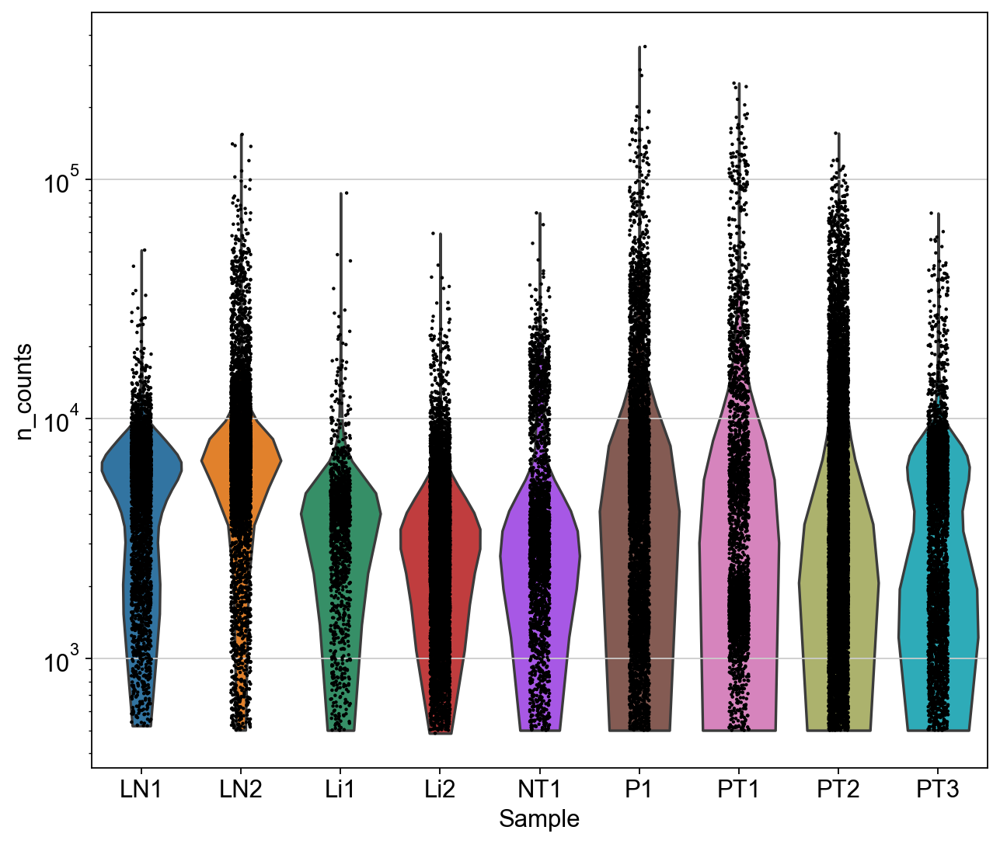

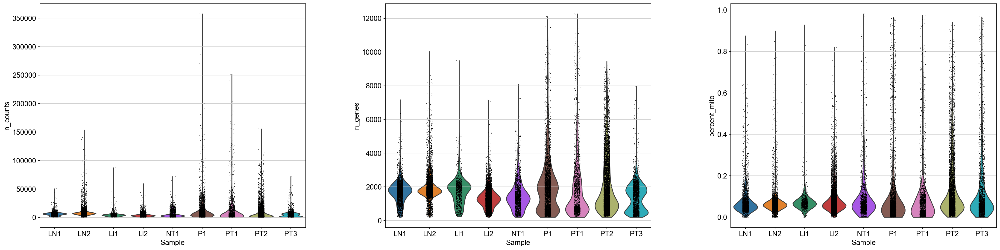

In [7]:
# Quality control - plot QC metrics
#Sample quality plots
plt.rcParams['figure.figsize']=(8,8)
t1 = sc.pl.violin(adata, 'n_counts', groupby='Sample', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, ['n_counts','n_genes','percent_mito'], groupby='Sample')

In [8]:
upper_lim = np.quantile(adata.obs.n_genes.values,.98)
lower_lim = np.quantile(adata.obs.n_genes.values,.02)
maxUMI = np.quantile(adata.obs.n_counts.values,.98)
print(f'{lower_lim} to {upper_lim}')
print(f'{maxUMI}')

314.0 to 5881.620000000003
36879.62


In [9]:
adata = adata[(adata.obs.n_genes < upper_lim)& (adata.obs.n_genes > lower_lim)]
adata = adata[adata.obs.percent_mito < 0.2,:]
adata = adata[adata.obs.n_counts <maxUMI]

## After QC

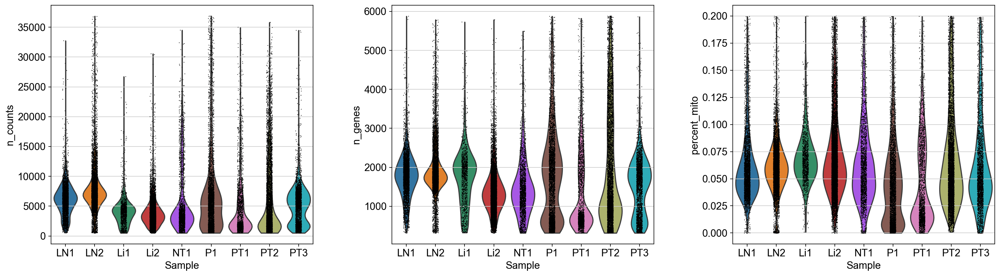

In [10]:
plt.rcParams['figure.figsize']=(6,6)
t3 = sc.pl.violin(adata, ['n_counts','n_genes','percent_mito'], groupby='Sample')

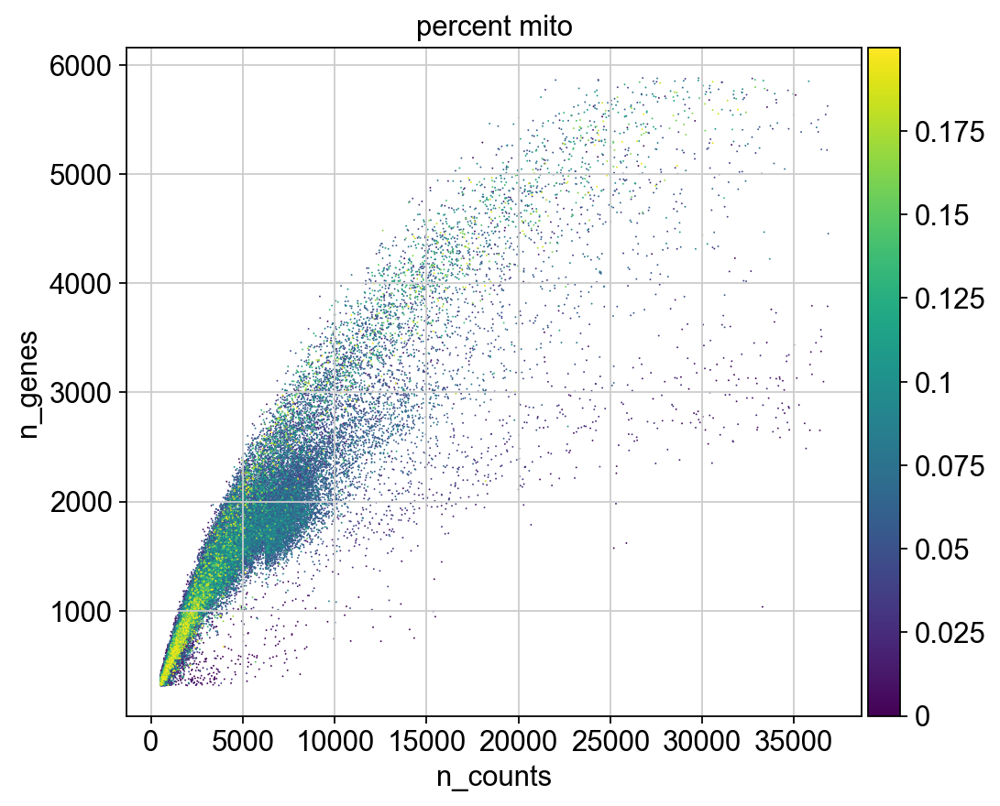

D:\conda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


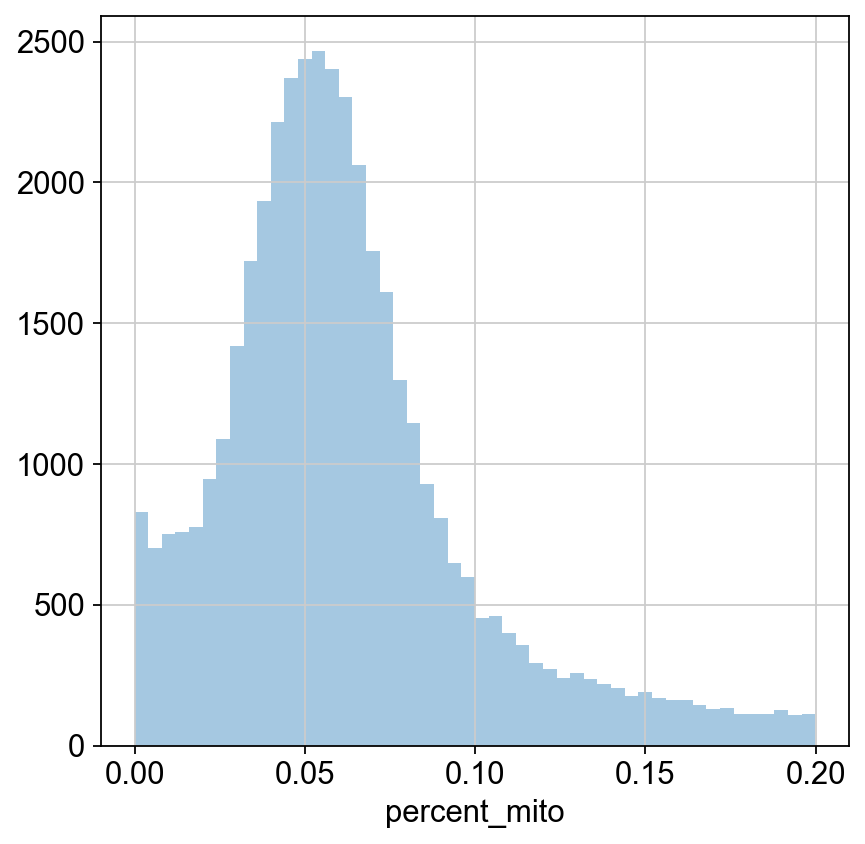

In [11]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='percent_mito')
p2 = sns.distplot(adata.obs['percent_mito'], kde=False)

# Calculate doublet score for each cell

In [14]:
scrub = scr.Scrublet(adata.X)
adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.59
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 19.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.8%
Elapsed time: 57.5 seconds


C:\Users\scholar\AppData\Local\Temp\ipykernel_5480\1114294960.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scrub.scrub_doublets()


In [15]:
num_predicted_doublets = sum(adata.obs['predicted_doublets'])
print(f"Predicted {num_predicted_doublets} doublets")

Predicted 143 doublets


In [16]:
adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)
adata.obs

,n_genes,ID,Sample,Tissue,metastasis_status,percent_mito,batch,n_counts,log_counts,doublet_scores,predicted_doublets,doublet_info
AAACCCACAACAACAA-1,352,GSM5004180,PT1,Gastric,Primary,0.008205,0,975.0,6.882438,0.013535,False,False
AAACCCAGTCAAAGTA-1,4415,GSM5004180,PT1,Gastric,Primary,0.076083,0,16022.0,9.681718,0.045936,False,False
AAACCCAGTGGATACG-1,492,GSM5004180,PT1,Gastric,Primary,0.009602,0,1458.0,7.284821,0.007528,False,False
AAACCCATCGTTCCCA-1,323,GSM5004180,PT1,Gastric,Primary,0.009579,0,522.0,6.257668,0.006400,False,False
AAACGAAAGCTGTTCA-1,771,GSM5004180,PT1,Gastric,Primary,0.005300,0,2264.0,7.724888,0.008459,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTGTCCGGT-1,1405,GSM5004189,Li2,Liver,Metastasis,0.134015,8,3813.0,8.246172,0.104972,False,False
TTTGTTGTCGCGCTGA-1,1068,GSM5004189,Li2,Liver,Metastasis,0.086989,8,2667.0,7.888710,0.113817,False,False
TTTGTTGTCGTAGGAG-1,1034,GSM5004189,Li2,Liver,Metastasis,0.043174,8,2432.0,7.796469,0.115385,False,False
TTTGTTGTCTAGAACC-1,1186,GSM5004189,Li2,Liver,Metastasis,0.054685,8,2615.0,7.869020,0.029126,False,False


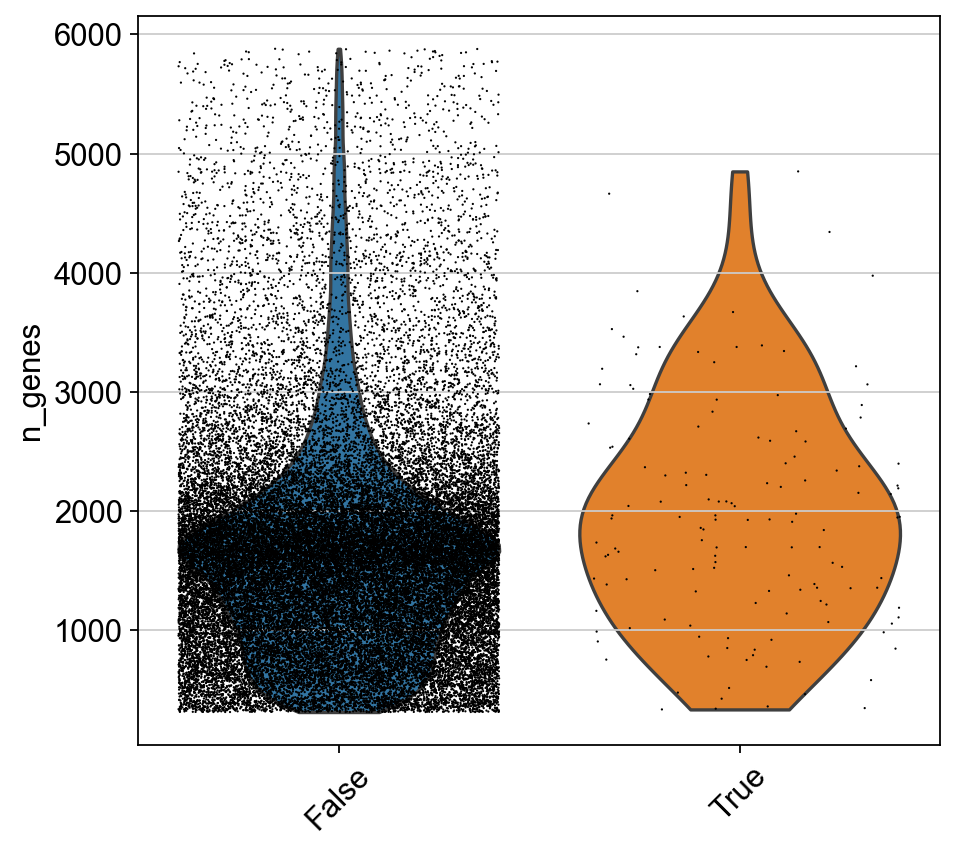

In [17]:
sc.pl.violin(adata, 'n_genes',
             jitter=0.4, groupby = 'doublet_info', rotation=45)

In [18]:
adata = adata[adata.obs['doublet_info'] == 'False',:]
print(adata.shape)

(41177, 25444)


In [19]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

D:\conda\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [20]:
adata

AnnData object with n_obs × n_vars = 41177 × 25444
    obs: 'n_genes', 'ID', 'Sample', 'Tissue', 'metastasis_status', 'percent_mito', 'batch', 'n_counts', 'log_counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8'
    uns: 'Sample_colors', 'doublet_info_colors', 'log1p'

In [21]:
adata.write('./cache/scRNA_qc.h5ad')

## feature selsction

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 2636


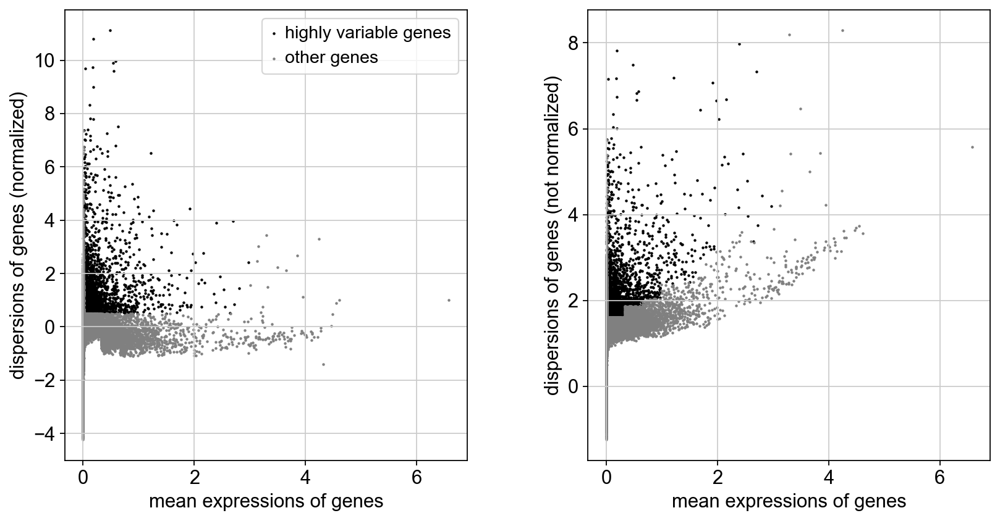

In [22]:
save_path = './01/'
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
print("Highly variable genes: %d"%sum(adata.var.highly_variable))
sc.pl.highly_variable_genes(adata,save='_filter.pdf')

In [23]:
adata.raw =adata

In [24]:
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value=10)

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:40)


# 主成分分析

In [25]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


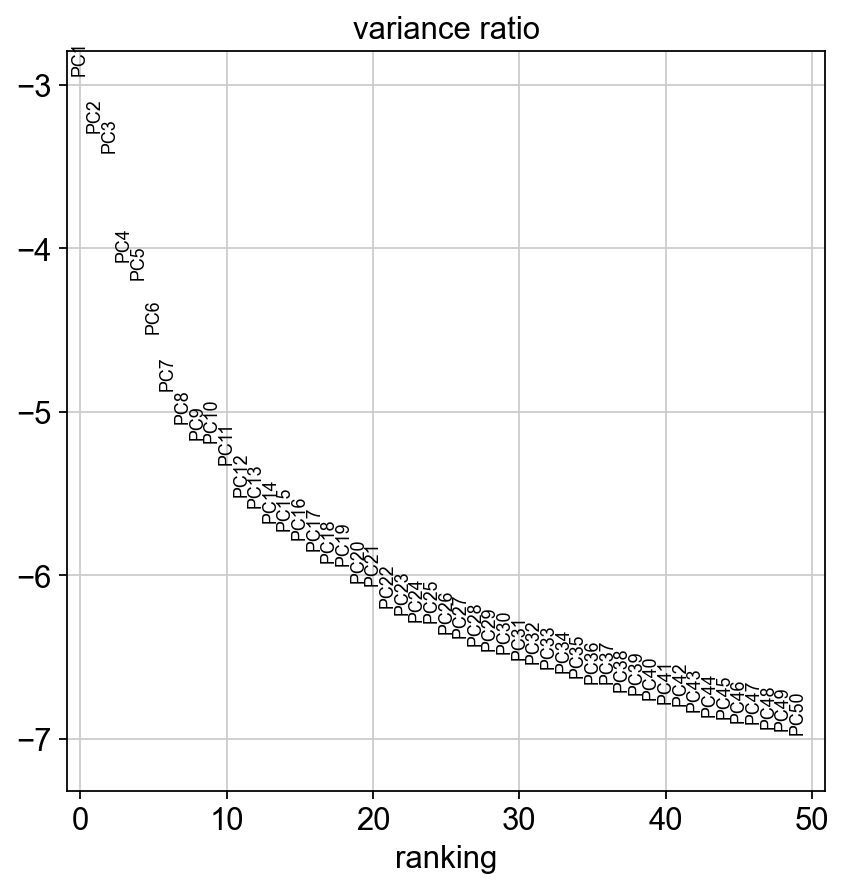

In [26]:
sc.pl.pca_variance_ratio(adata, log=True,n_pcs = 50)

<AxesSubplot:>

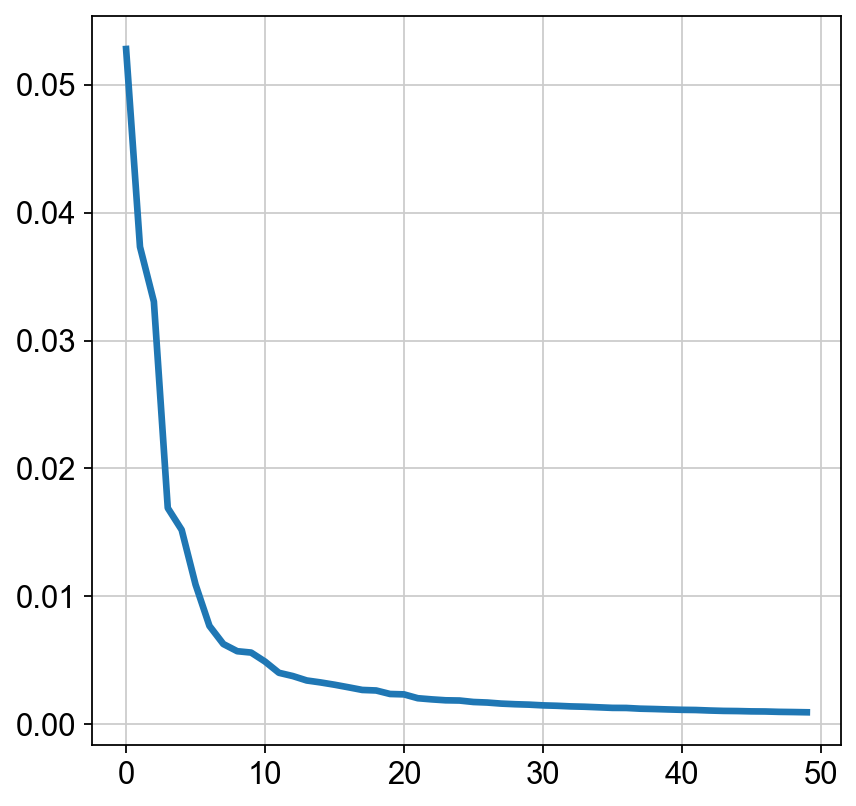

In [27]:
sns.lineplot(data = adata.uns['pca']['variance_ratio'],palette= 'tab10',linewidth = 3)

In [28]:
adata.uns['pca']['variance']

array([114.87136  ,  81.22433  ,  71.89904  ,  36.797314 ,  33.078903 ,
        23.768223 ,  16.736542 ,  13.655714 ,  12.432928 ,  12.20209  ,
        10.671145 ,   8.763934 ,   8.207649 ,   7.456708 ,   7.1234026,
         6.7347226,   6.2980003,   5.8457055,   5.75224  ,   5.1574235,
         5.091454 ,   4.436392 ,   4.2405095,   4.083996 ,   4.0440726,
         3.7965267,   3.7017384,   3.5216818,   3.4156973,   3.3447006,
         3.221163 ,   3.151894 ,   3.0470462,   2.9879508,   2.8921163,
         2.7951612,   2.7818153,   2.6574235,   2.601034 ,   2.527686 ,
         2.4656088,   2.433006 ,   2.3448045,   2.2805808,   2.2536948,
         2.199384 ,   2.1803997,   2.1162877,   2.0858374,   2.0453606],
      dtype=float32)

<AxesSubplot:>

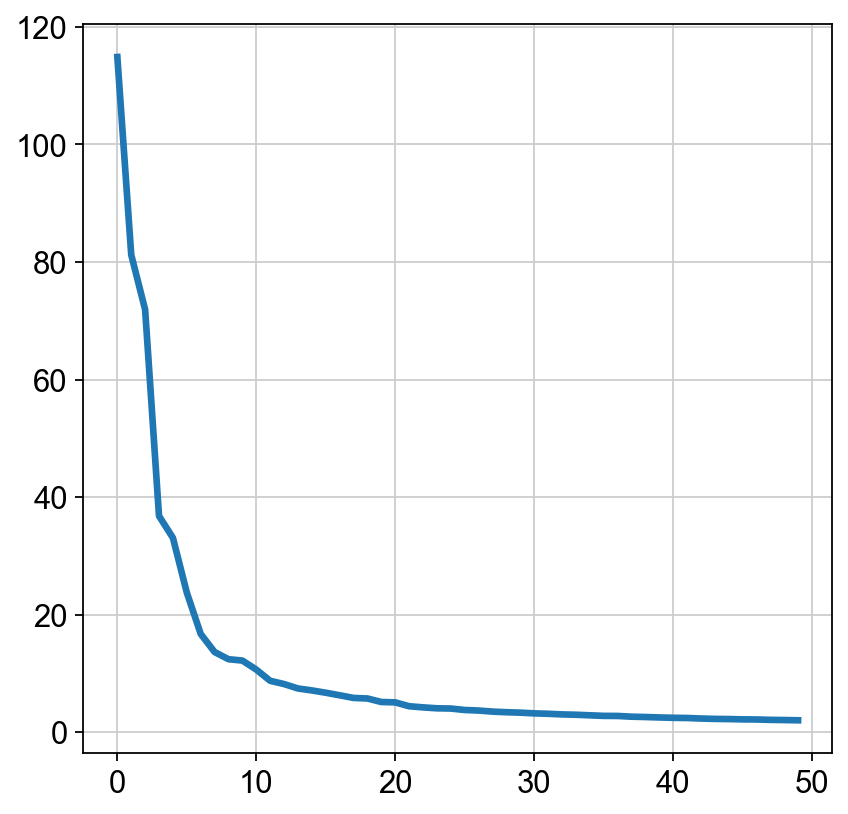

In [29]:
sns.lineplot(data =adata.uns['pca']['variance'],palette='tab10',linewidth = 3)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
neighbors的数值为：10


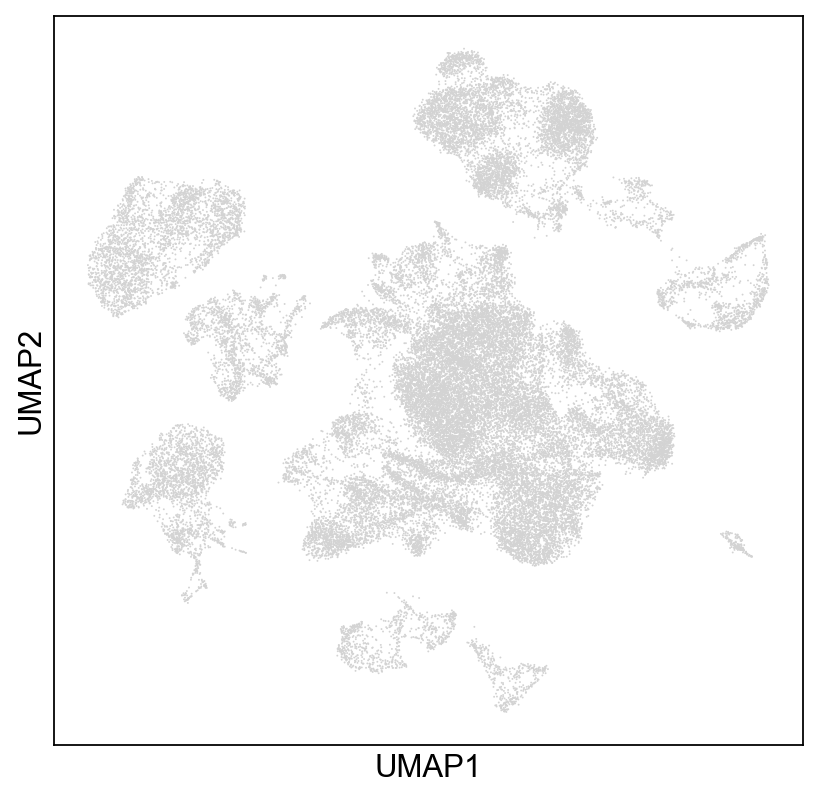

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)
neighbors的数值为：15


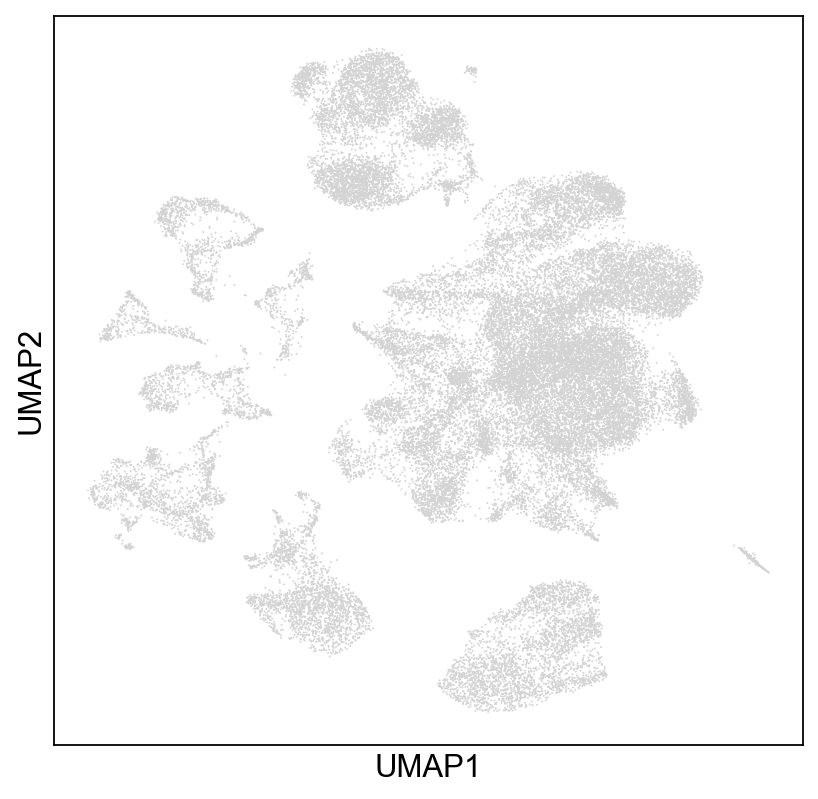

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)
neighbors的数值为：20


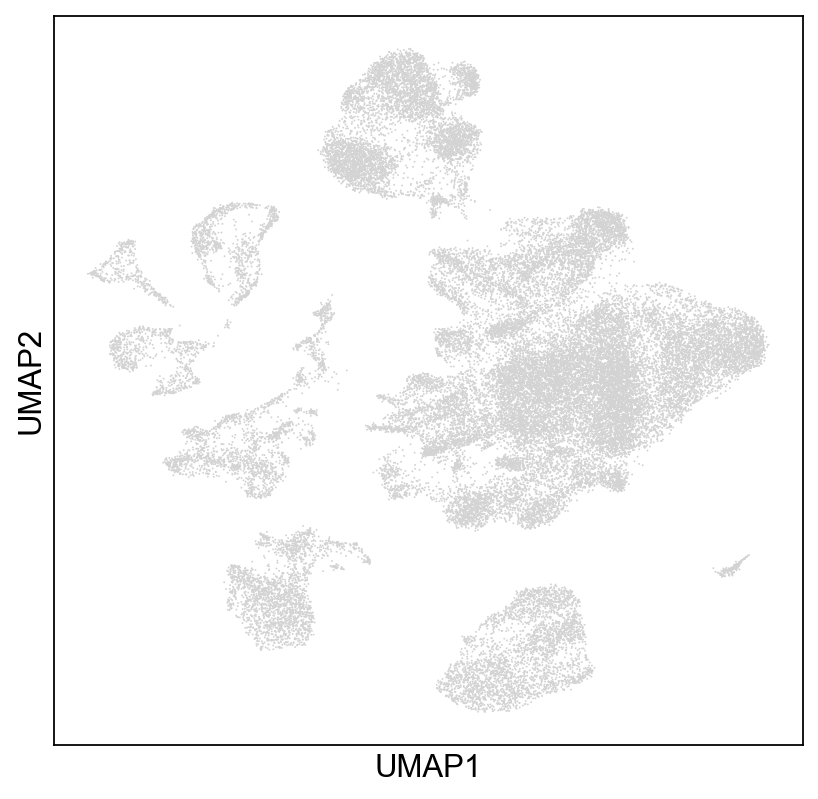

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)
neighbors的数值为：25


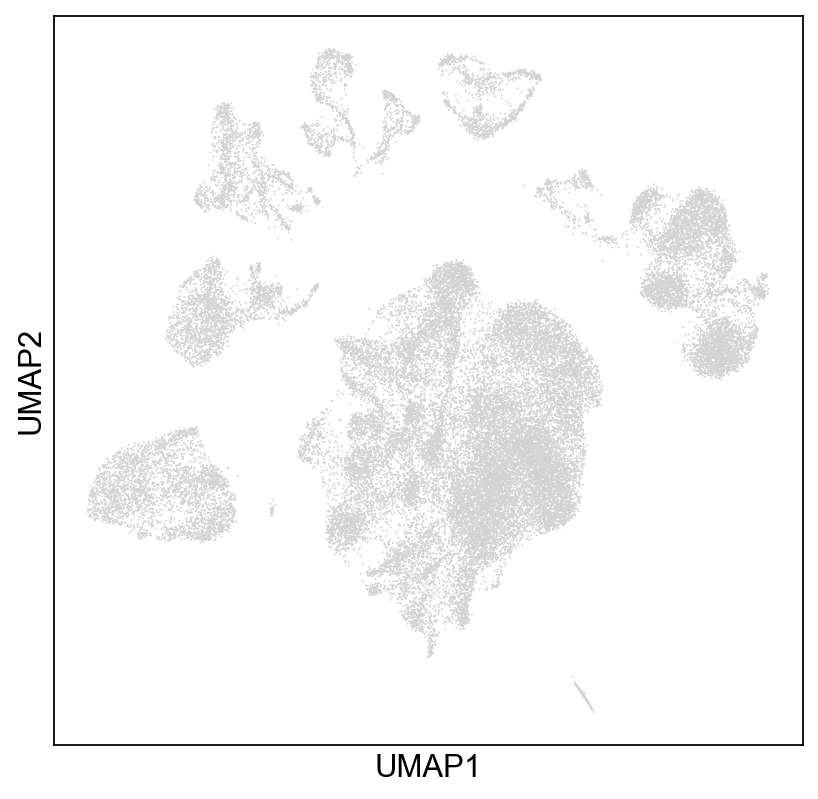

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)
neighbors的数值为：30


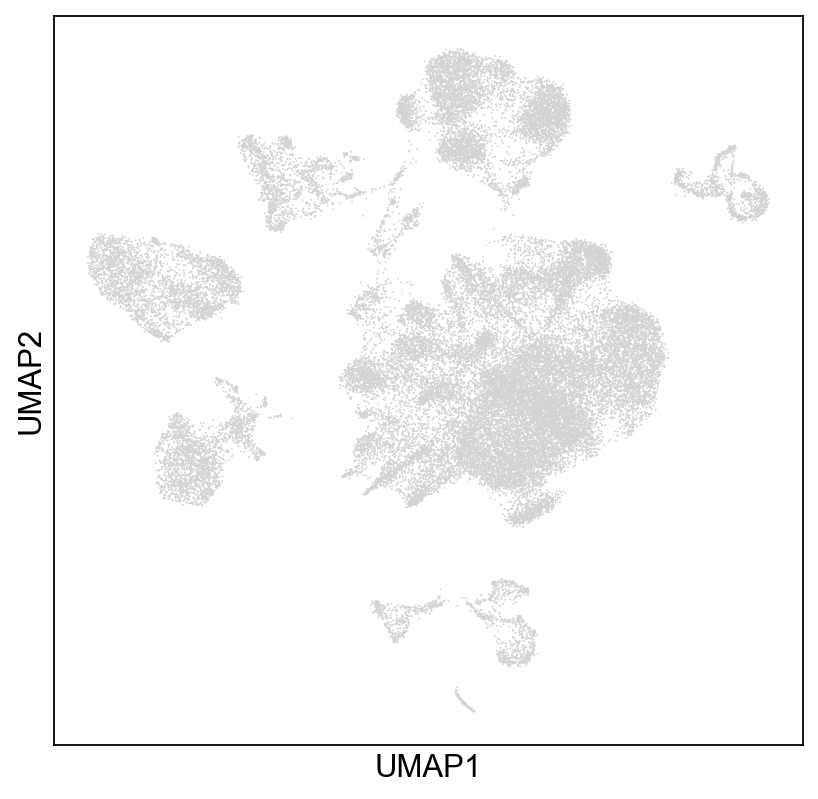

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)
neighbors的数值为：35


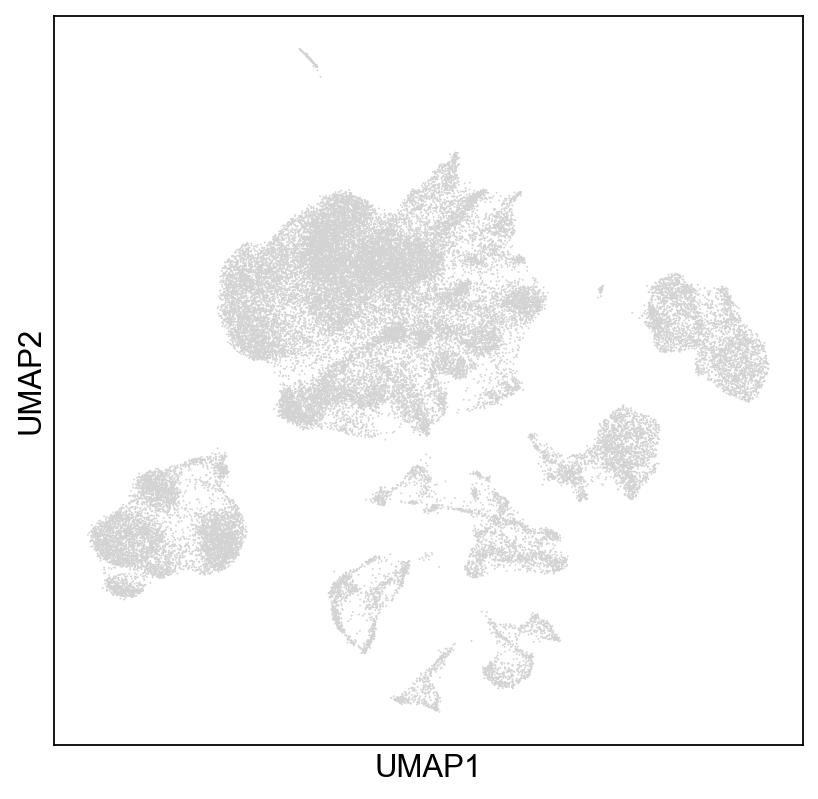

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)
neighbors的数值为：40


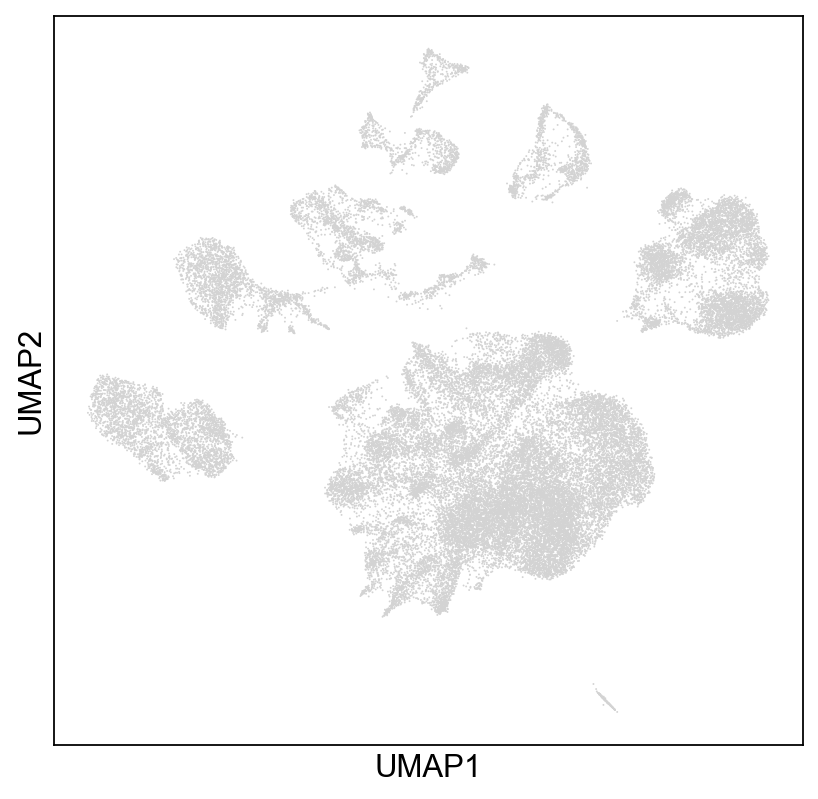

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)
neighbors的数值为：45


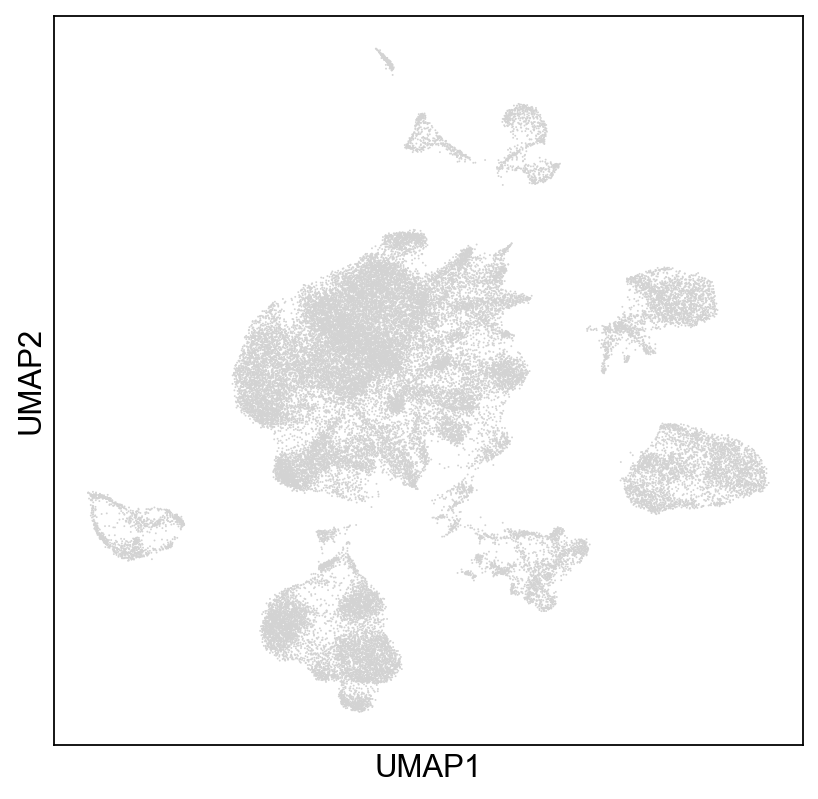

In [34]:
for i in range(10,50,5):
    sc.pp.neighbors(adata,n_pcs=40, n_neighbors= i)
    sc.tl.umap(adata)
    print(f'neighbors的数值为：{i}')
    sc.pl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


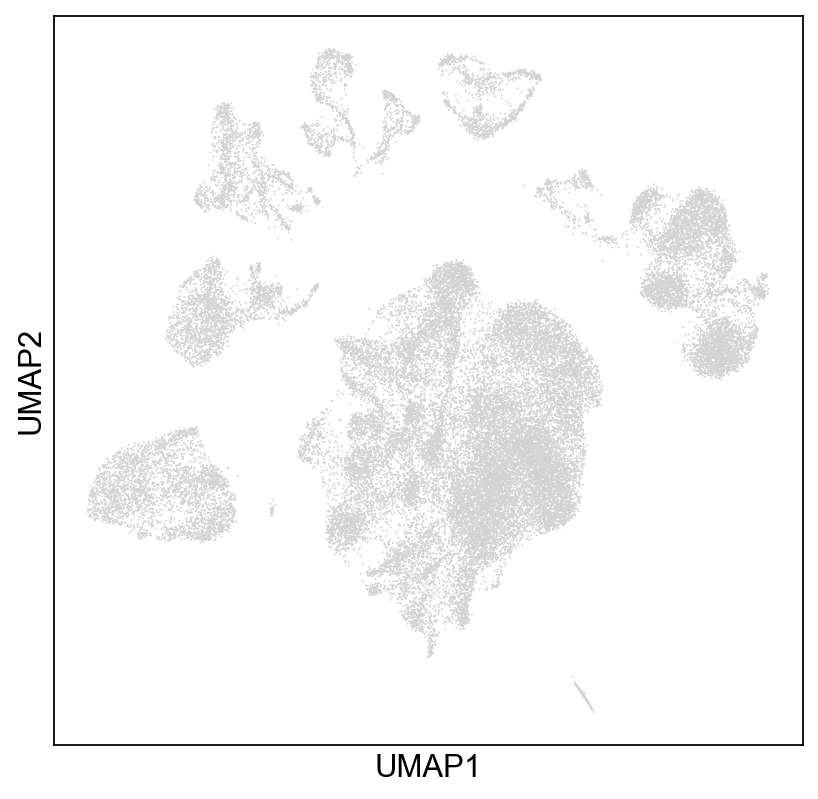

In [36]:
    sc.pp.neighbors(adata,n_pcs=40, n_neighbors= 25)
    sc.tl.umap(adata)
    sc.pl.umap(adata)

In [38]:
for i in range(1,16):
    sc.tl.leiden(adata,resolution=round(i*0.1,1),key_added=f'cluster_{round(i*0.1,1)}')

running Leiden clustering
    finished: found 9 clusters and added
    'cluster_0.1', the cluster labels (adata.obs, categorical) (0:00:08)
running Leiden clustering
    finished: found 14 clusters and added
    'cluster_0.2', the cluster labels (adata.obs, categorical) (0:00:10)
running Leiden clustering
    finished: found 15 clusters and added
    'cluster_0.3', the cluster labels (adata.obs, categorical) (0:00:10)
running Leiden clustering
    finished: found 17 clusters and added
    'cluster_0.4', the cluster labels (adata.obs, categorical) (0:00:12)
running Leiden clustering
    finished: found 19 clusters and added
    'cluster_0.5', the cluster labels (adata.obs, categorical) (0:00:14)
running Leiden clustering
    finished: found 21 clusters and added
    'cluster_0.6', the cluster labels (adata.obs, categorical) (0:00:09)
running Leiden clustering
    finished: found 25 clusters and added
    'cluster_0.7', the cluster labels (adata.obs, categorical) (0:00:21)
running Leiden

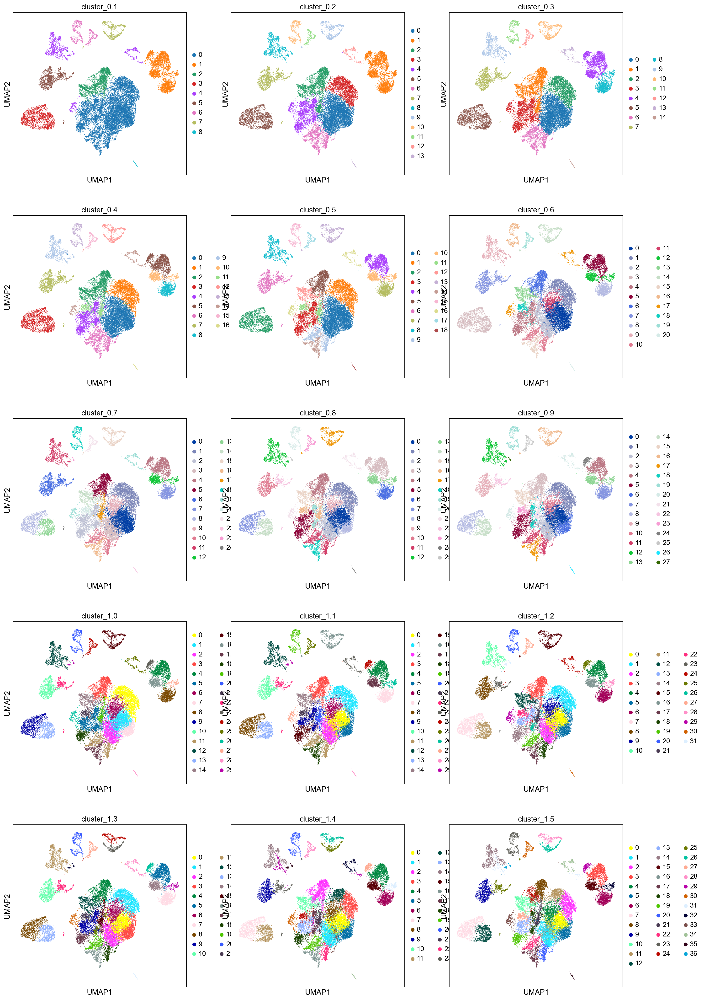

In [41]:
sc.pl.umap(adata,color = [f'cluster_{round(i*0.1,1)}' for i in range(1,16)],ncols = 3)

In [42]:
adata.write('./cache/scRNA_cluster.h5ad')